# Guide to Plot Sankey Diagram using Holoviews

## What is Sankey Diagram (Alluvial Diagram)?

The Sankey Diagram (also commonly referred to as Alluvial Diagram) can be used to analyze the flow of property between two or more data variables. The data variables are categorical columns of data and the quantity of property that flows between them can be any continuous variable of data that flows between values of categorical variables. It has a level for each categorical data variable where the individual nodes of that level represent the individual category in that categorical variable. There are links between nodes of different levels to show the flow of quantity between different categorical values of different levels. The width of these links is in the proportion of the amount of the quantity flowing between two categorical values. The Sankey diagram can be used to analyze energy flow, population migration, website traffic flow, etc.

The Sankey diagram can be very useful in understanding the flow of property between different values of a categorical variable which can help us understand the contribution of different values based on flow.

The Sankey diagram should not be used in situations where there are lots of categories per categorical variable as it'll make the chart cluttered. In this kind of situation, we can introduce some kind of threshold to remove categories that are not making any significant contribution to be considered enough for analysis.


## What is Holoviews?

Python has a long list of visualization libraries like matplotlib, bokeh, seaborn, plotly, Altair, bqplot, geopandas, cartopy, folium, ipyleaflet, datashader, etc. Some of these libraries can help us generate static plots whereas others can help us generate interactive plots. All these visualization libraries require some learning curve and have a different syntax which can take time to master. All of them require setting up of individual components of charts like axis, ticks, labels, etc in order to generate chart and these decision needs to be made by developers.

Holoviews is an open-source data visualization library that lets us create interactive charts with a minimum amount of code. The number of lines required to create a chart using holoviews is usually quite less compared to other libraries. Holoviews frees developers from the worry of visualization aspects like labels, ticks, etc, and lets him/her concentrate more on actual data analysis. This saves a lot of time of developers which might have been wasted in properly implementing visualization and can now be invested in more detailed data analysis.

Holoviews basically creates metadata of the visualizations. Holoviews internally uses libraries bokeh, matplotlib, and plotly for plotting actual charts. Holoviews lets us describe our data using metadata which will then be converted to the chart using either matplotlib, bokeh, or plotly. We can easily define a small amount of metadata than can build on that metadata to add more information. It still provides low-level access to modify lower-level details of charts like ticks, labels, background color, etc but default settings are generally very well set which will look good in the majority of cases.

Holoviews lets us work directly on data from pandas dataframe by specifying column names of a data frame as dimensions of data which we'll explain in detail through our examples.

The holoviews is designed to work with Jupyter Notebook and Jupyter Lab.

The primary reason behind choosing holoviews is the flexibility of the library which lets us create interactive and static charts both as well as less amount of code to implement complicated visualizations.


#### Install Holoviews

* `pip install holoviews`
* `conda install -c pyviz holoviews bokeh`

## Health E-Commerce Website Visits and Purchase Data Analysis

In order to explain how we can plot Sankey Diagram using holoviews, we have downloaded the health e-commerce website dataset from kaggle which has information about user sessions which includes details like user pageviews and purchase data along with few more personal user details for the period of 7-25-2014 to 9-11-2014.

**Source** - [Health E-commerce Website Visits Data](https://www.kaggle.com/rajeck/health-ecommerce-website-visits)

The dataset has the below-mentioned list of columns that will be explored for relationships using Sankey Diagrams.

* **dateTime** - It has datetime of use visit to a website.
* **country** - It has information about the user's country.
* **profile** - It holds user profile types like a parent, friend, family, relative, etc.
* **age** - It has user age group details. Groups are less than 18, 18-24, 25-34,35-44,45-54,55-64,65 or more.
* **gender** - It has gender information.
* **referral** - It has information about the source of traffic like a search engine, social media site, ads, etc. 
* **pageviews** - It has a count of page views visited by users in that session.
* **purchased** - It's a boolean column specifying whether the user purchased something or not.
* **purchaseAmount** - It has purchase amount.

#### For what purpose this dataset will be used?

We'll be using this dataset to understand the purchase and website visit behavior of people based on traffic source, country, profile type, gender, and age group.

We'll start by loading the necessary libraries.






In [1]:
import pandas as pd
import holoviews as hv

### Loading and Cleaning Dataset

We'll load our dataset using pandas as a data frame. We have found out that **gender** column has many null values hence we have filled null values with the string **NA**. By default, pandas loaded **dateTime** column as string. We have converted it to datetime format. We have then sorted the dataset based on the datetime column.

We have displayed the first few and last few rows of the dataset as well to give an idea of the data that we'll be working with.





In [2]:
health_dataset = pd.read_csv("health_dataset/health-ecommerce-website.csv")

health_dataset["gender"] = health_dataset["gender"].fillna("NA")

health_dataset["dateTime"] = pd.to_datetime(health_dataset.dateTime)

health_dataset = health_dataset.sort_values(by="dateTime")

print("Dataset Size : {}".format(health_dataset.shape))

health_dataset.head()

Dataset Size : (1592, 9)


,dateTime,country,profile,age,gender,referral,pageviews,purchased,purchaseAmount
442,2014-07-25 14:10:00,United States,Parent,25-34,Female,Direct,6,0,0.0
589,2014-07-25 15:01:00,United States,Parent,35-44,Female,Unbranded Search,1,0,0.0
590,2014-07-25 15:15:00,United States,Parent,35-44,Female,Unbranded Search,10,0,0.0
1215,2014-07-25 17:05:00,United States,Patient,25-34,Female,Unbranded Search,11,0,0.0
1437,2014-07-26 00:27:00,United States,Teacher,55-64,Female,Referred,3,0,0.0


In [3]:
health_dataset.tail()

,dateTime,country,profile,age,gender,referral,pageviews,purchased,purchaseAmount
557,2014-09-11 11:16:00,United States,Parent,35-44,Female,Direct,11,0,0.0
859,2014-09-11 11:18:00,United States,Parent,45-54,NA,Direct,4,0,0.0
1266,2014-09-11 11:33:00,United States,Relative,25-34,Female,Unbranded Search,12,0,0.0
691,2014-09-11 11:42:00,United States,Parent,25-34,Male,Direct,4,0,0.0
201,2014-09-11 11:53:00,United States,Health Professional,35-44,NA,Direct,5,0,0.0


### Country to User Profile Page Views Distribution Analysis

As a part of our first chart, we'll use the Sankey diagram to look at how many page views count of people from a particular country with a particular profile This can help us understand which country's people's profile is visiting more. This can help us target people with that profile and country to increase revenue.



#### Loading Bokeh Extension for Plotting Charts

We have loaded **bokeh** as an extension which will be used for plotting the chart. Later on, we'll explain how we can use **matplotlib** as a backend to plot the Sankey diagram.






<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
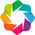

In [4]:
hv.extension("bokeh")

#### Sankey()

The holoviews as the method named **Sankey()** which can be used for plotting Sankey diagrams. It accepts the dataframe as input from which the Sankey diagram will be created. 

It expects that dataframe has three columns. 

* The first column has information about the source of property.
* The second column has information about the destination of the property.
* The third column has information about the quantity of particular property which follows between a particular source and destination.

The **Sankey()** method two important parameters.
* **kdims** - This expects a list of column names between whom the relationship will be shown. It should be the name of the columns from the data frame which will be used as source and destination.
* **vdims** - This expects a single column name that will have a quantity of property that flows between source and destination.

If we don't provide **kdims** and **vdims** then **Sankey()** method takes the first two columns of the dataframe as the source and destination columns and the third column as a quantity that flows between them by default.

#### Data Preparation

Below we have first grouped data by country and profile and then summed up page views values for each group. This will give us a data frame where there is one entry for each combination of country and user profile along with page views performed by that combination.

We have then filtered the dataframe to keep only entries that have more than 15 page views in order to prevent the chart from getting cluttered. We want to use this dataset to see major contributors.






In [5]:
country_profile_pageviews = health_dataset.groupby(by=["country", "profile"]).sum()[["pageviews"]].reset_index()

country_profile_pageviews = country_profile_pageviews[country_profile_pageviews.pageviews > 15]

country_profile_pageviews.head()

,country,profile,pageviews
1,Australia,Health Professional,20
2,Australia,Other,25
3,Australia,Parent,201
6,Australia,Teacher,84
12,Canada,Health Professional,21


Below we have created a Sankey diagram with just one line of code by calling **Sankey()** method of holoviews. We have given the dataframe which we created in the previous step and it has created a chart for us. 

We can notice from the below Sankey diagram that the majority of website page views come from the US followed by Canada, Australia, and the US. The majority of page views are performed by parent profile types followed by health professionals and teachers.





In [6]:
hv.Sankey(country_profile_pageviews)

:Sankey   [country,profile]   (pageviews)

###  Country to Traffic Source Page Views Distribution Analysis

As a part of this example, we'll use the Sankey diagram to understand page views performed by people from a particular country and particular traffic sources.

We have grouped the health dataset by country and referral and then summed up page views for each group. This will return us a dataframe that has page views count for each country and referral combinations.




In [7]:
country_referrel_pageviews = health_dataset.groupby(by=["country", "referral"]).sum()[["pageviews"]].reset_index()

country_referrel_pageviews = country_referrel_pageviews[country_referrel_pageviews.pageviews > 15]

country_referrel_pageviews.head()

,country,referral,pageviews
1,Australia,Direct,76
3,Australia,Referred,30
5,Australia,Social,27
6,Australia,Unbranded Search,198
12,Canada,Direct,90


Below we have created our second Sankey diagram but this time we have modified the look of the chart with the addition of two lines. We can even combine these two lines into one line by putting parenthesis key-value combinations after bracket key-value combinations. Each key-value combination represents chart property.

Holoviews let us specify chart properties by providing a list of key-value pairs between bracket and parenthesis.

* The key-value pairs provided between brackets are related to chart dimensions, tick positions, title, etc.
* The key-value pairs provided between parenthesis are related to chart look and feel.

We can retrieve a list of all possible keys by pressing **Tab** inside of bracket or parenthesis specified after **%%opts**. It'll list down all possible key which can be set. The **%%opts** let us specify options for this chart.

We can also call **opts()** method on chart instance returned by **Sankey()** method to set various chart attributes and the results will be the same as below.

We can notice from the below chart that the majority of US traffic comes from unbranded searches. The second source of traffic is direct users. The referred is the third source of traffic followed by the social and branded search. There is also a little contribution to marketing emails.





In [8]:
%%opts Sankey [height=800 width=800 node_width=40 bgcolor="snow" label_position="left" title="Traffic Source to Country Pageviews"]
%%opts Sankey (cmap="Category10" edge_color="referral")

hv.Sankey(country_referrel_pageviews, kdims=["country", "referral"], vdims=["pageviews"])

:Sankey   [country,referral]   (pageviews)

### Profile to Traffic Source Page Views Analysis

As a part of this section, we'll analyze page view distribution between the traffic source and profile types. 

We have created a dataframe by grouping entries based on referral and profile type. We have then summed up entries in the group for page views so that we have page views count for each referral and profile type combinations.




In [9]:
referrel_profile_pageviews = health_dataset.groupby(by=["referral", "profile"]).sum()[["pageviews"]].reset_index()

referrel_profile_pageviews.head()

,referral,profile,pageviews
0,Branded Search,Friend/family friend,12
1,Branded Search,Health Professional,98
2,Branded Search,Other,35
3,Branded Search,Parent,174
4,Branded Search,Relative,45


Below we have created a Sankey diagram based on the dataframe created in the previous cell. Again we were able to create such a complicated Sankey diagram with quite less number of lines. In reality, there are only two lines, but we have shown parameters in three lines to increase the readability of the code else they can be wrapped up in a single line.

We can notice from the chart that the major traffic source for all of the profiles is unbranded search (organic traffic) followed by direct traffic which shows website popularity.





In [10]:
%%opts Sankey [height=700 width=800 node_width=40]
%%opts Sankey [bgcolor="mintcream" label_position="left" title="Profile to Traffic Source Pageviews"] 
%%opts Sankey (cmap="Category10" edge_color="profile" cmap="Colorblind" edge_line_width=0.0)

hv.Sankey(referrel_profile_pageviews, kdims=["profile", "referral"], vdims=["pageviews"])

:Sankey   [profile,referral]   (pageviews)

#### Setting Matplotlib as Backend

Below we have set backend as **matplotlib** in order to create a Sankey diagram using **matplotlib**. We have then executed the same python code as the earlier one and it created a Sankey diagram using **matplotlib**.

This is a very useful feature provided by **holoviews** that lets us use the same code across multiple plotting libraries. It takes care of everything on its own hence developers don't need to worry about correcting visualization.





In [11]:
hv.extension("matplotlib")

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

:Sankey   [profile,referral]   (pageviews)
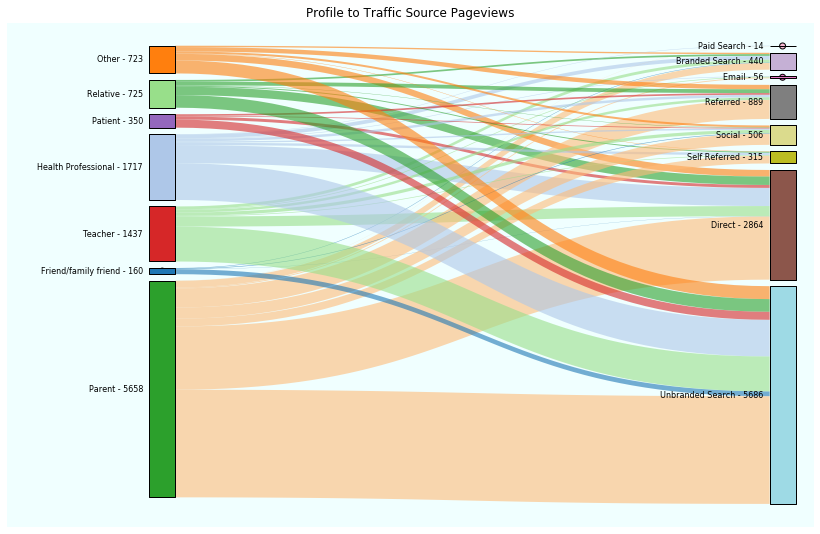

In [12]:
%%opts Sankey [height=700 width=800 node_width=40 bgcolor="azure"]
%%opts Sankey [label_position="left" title="Profile to Traffic Source Pageviews"] 
%%opts Sankey (cmap="tab20" edge_color="profile" edge_line_width=0.0)

hv.Sankey(referrel_profile_pageviews, kdims=["profile", "referral"], vdims=["pageviews"])

### Analyzing Page Views Relation Between Traffic Source, Profile, and Gender

As a part of this section, we'll show how page views are related between traffic source, profile, and gender.

We have first reset the back end as **bokeh** again because we had changed it to **matplotlib** in the previous cell for an explanation.





<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
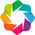

In [13]:
hv.extension("bokeh")

In order to create a dataframe for this Sankey diagram of this section, we have first created two individual data frames and then combined both data frames to create a single data frame from which the Sankey diagram will be created.

The first data frame is created by grouping the original health dataset based on referral and profile columns and then summing up entries based on page views. This dataframe will have one entry for each combination of referral and profile type with page views for each combination.

The second data frame is created by grouping health datasets based on profile type and gender and then summing up entries based on page views. This data frame will have one entry for each combination of profile type and gender with page views for each combination.

At last, we have combined both datasets to create a single dataset from which the Sankey diagram will be created.






In [14]:
ref_prof_pageviews = health_dataset.groupby(by=["referral", "profile"]).sum()[["pageviews"]].reset_index()
ref_prof_pageviews.columns = ["Source", "Destination", "Pageviews"]

prof_gender_pageviews = health_dataset.groupby(by=["profile", "gender"]).sum()[["pageviews"]].reset_index()
prof_gender_pageviews.columns = ["Source", "Destination", "Pageviews"]

ref_prof_gender_pageviews = pd.concat((ref_prof_pageviews, prof_gender_pageviews))

ref_prof_gender_pageviews.head()

,Source,Destination,Pageviews
0,Branded Search,Friend/family friend,12
1,Branded Search,Health Professional,98
2,Branded Search,Other,35
3,Branded Search,Parent,174
4,Branded Search,Relative,45


Below we have created a Sankey diagram from the data frame created in the previous step. We have also modified various attributes of the chart like colormap, edge color, label position, background color, etc.

We can notice from the Sankey diagram that the majority of page views are from parents, health professionals,s and teachers. The majority of a parent, health professional, and teacher has female gender. The gender of the majority of teachers is unknown and the teacher has the gender of female or unknown. The majority of health professionals also have female gender. The male representation is quite less.





In [15]:
%%opts Sankey [height=700 width=950 node_width=40]
%%opts Sankey [bgcolor="lavenderblush" label_position="left" title="Pageviews relation between traffic source, profile and gender"] 
%%opts Sankey (cmap="Category10" edge_color="Source")

hv.Sankey(ref_prof_gender_pageviews, kdims=["Source", "Destination"], vdims=["Pageviews"])

:Sankey   [Source,Destination]   (Pageviews)

### Analyzing Page Views Relation Between Traffic Source, Profile, Gender and Age Group

As a part of our analysis in this section, we'll show how page views distributed between referral, profile type, gender, and age group column of data.

Below we have created 3 individual data frames which will be combined at last to generate the final dataframe from which the Sankey diagram will be created.

The first dataframe has page views for each combination of referral and profile type. The second data frame has page views for each combination of profile type and gender. The third data frame has page views for each combination of gender and age group. We have created each data frame by grouping health datasets based on two columns and then summing them up based on page views.





In [16]:
ref_prof_pageviews = health_dataset.groupby(by=["referral", "profile"]).sum()[["pageviews"]].reset_index()
ref_prof_pageviews.columns = ["Source", "Destination", "Pageviews"]

prof_gender_pageviews = health_dataset.groupby(by=["profile", "gender"]).sum()[["pageviews"]].reset_index()
prof_gender_pageviews.columns = ["Source", "Destination", "Pageviews"]

gender_age_pageviews = health_dataset.groupby(by=["gender", "age"]).sum()[["pageviews"]].reset_index()
gender_age_pageviews.columns = ["Source", "Destination", "Pageviews"]

ref_prof_gender_age_pageviews = pd.concat((ref_prof_pageviews, prof_gender_pageviews, gender_age_pageviews))

ref_prof_gender_age_pageviews.head()

,Source,Destination,Pageviews
0,Branded Search,Friend/family friend,12
1,Branded Search,Health Professional,98
2,Branded Search,Other,35
3,Branded Search,Parent,174
4,Branded Search,Relative,45


In [17]:
%%opts Sankey [height=700 width=950 node_width=40]
%%opts Sankey [bgcolor="ivory" label_position="left" title="Pageviews relation between traffic source, profile, gender and age group"] 
%%opts Sankey (cmap="Category10" edge_color="Source" edge_line_width=0)

hv.Sankey(ref_prof_gender_age_pageviews, kdims=["Source", "Destination"], vdims=["Pageviews"])

:Sankey   [Source,Destination]   (Pageviews)

### Analyzing Purchased Amount Relation Between Traffic Source,  Profile, Gender and Age Group

As a part of our analysis in this section, we'll show the relation between traffic source, profile type, gender, and age group based on the purchase amount of the user.

We have created three individual data frames which have been then combined into a single data frame from which the Sankey diagram will be created. The first data frame groups record by referral and profile type and then sum up the purchase amount of each group (a combination of referral and profile type). The second data frame groups record by profile type and gender and then sum up the purchase amount of each group (a combination of profile type and gender type). The first data frame groups record by gender type and age group and then sum up the purchase amount of each group (a combination of gender and age group type). We have then combined all three data frames into a single data frame. 

At last, we have created a Sankey diagram from this final data frame. The nodes in the first level of the diagram represent a different type of traffic source. The nodes in the second level of the diagram represent a different type of user profile. The nodes in the third level of the diagram represent a different type of gender. The nodes in the fourth level of the diagram represent a different type of age group.






In [18]:
ref_prof_pur_amt = health_dataset.groupby(by=["referral", "profile"]).sum()[["purchaseAmount"]].reset_index()
ref_prof_pur_amt.columns = ["Source", "Destination", "PurchaseAmount"]

prof_gender_pur_amt = health_dataset.groupby(by=["profile", "gender"]).sum()[["purchaseAmount"]].reset_index()
prof_gender_pur_amt.columns = ["Source", "Destination", "PurchaseAmount"]

gender_age_pur_amt = health_dataset.groupby(by=["gender", "age"]).sum()[["purchaseAmount"]].reset_index()
gender_age_pur_amt.columns = ["Source", "Destination", "PurchaseAmount"]

ref_prof_gender_age_pur_amt = pd.concat((ref_prof_pur_amt, prof_gender_pur_amt, gender_age_pur_amt))

ref_prof_gender_age_pur_amt = ref_prof_gender_age_pur_amt[ref_prof_gender_age_pur_amt.PurchaseAmount > 0]

ref_prof_gender_age_pur_amt.head()

,Source,Destination,PurchaseAmount
1,Branded Search,Health Professional,111.72
2,Branded Search,Other,184.43
3,Branded Search,Parent,482.51
4,Branded Search,Relative,76.98
5,Branded Search,Teacher,242.28


In [19]:
%%opts Sankey [height=700 width=950 title="Purchased Amount relation between referral, profile, gender and age group"]
%%opts Sankey [node_width=40 bgcolor="lightgrey" label_position="left"] 
%%opts Sankey [node_sort=True margin=0 padding=0]
%%opts Sankey (edge_color="Source" edge_line_width=2 node_cmap="tab10" cmap="tab10_r")
%%opts Sankey (node_alpha=1.0 edge_alpha=0.8 edge_hover_fill_color="red" edge_line_width=0 node_line_width=0)

hv.Sankey(ref_prof_gender_age_pur_amt, kdims=["Source", "Destination"], vdims=["PurchaseAmount"])

:Sankey   [Source,Destination]   (PurchaseAmount)

### Analyzing Relation Between Traffic Source, Profile, and Gender for Customers Who Purchased

As a part of this section, we'll show the relationship between traffic source, profile type, and gender for customers who did purchase from the website.

We have first filtered the dataset to keep only entries where the customer has purchased something from the website. We have then created a dataset that has an entry for each combination of traffic source and profile type along with page views per combination. Then we have created another dataset that has an entry for each combination of profile type and gender along with page views per combination. We have then combined these datasets to create a single dataset. This final dataset will have page views for customers who purchased something from the website. This can help us understand which combination is visiting how many pages before purchasing an item from the website.






In [20]:
purchased_dataset = health_dataset[health_dataset["purchased"] == 1]
ref_prof_pageviews = purchased_dataset.groupby(by=["referral", "profile"]).sum()[["pageviews"]].reset_index()
ref_prof_pageviews.columns = ["Source", "Destination", "Pageviews"]

prof_gender_pageviews = purchased_dataset.groupby(by=["profile", "gender"]).sum()[["pageviews"]].reset_index()
prof_gender_pageviews.columns = ["Source", "Destination", "Pageviews"]

ref_prof_gender_purchased_pageviews = pd.concat((ref_prof_pageviews, prof_gender_pageviews))

ref_prof_gender_purchased_pageviews.head()

,Source,Destination,Pageviews
0,Branded Search,Health Professional,8
1,Branded Search,Other,7
2,Branded Search,Parent,55
3,Branded Search,Relative,10
4,Branded Search,Teacher,16


In [21]:
%%opts Sankey [height=700 width=950 node_width=40 bgcolor="aliceblue" node_sort=True]
%%opts Sankey [label_position="left" title="Purchase count relation between referral, profile and gender"] 
%%opts Sankey (cmap="Category10" edge_color="Source" edge_line_width=0 node_line_width=0)

hv.Sankey(ref_prof_gender_purchased_pageviews, kdims=["Source", "Destination"], vdims=["Pageviews"])

:Sankey   [Source,Destination]   (Pageviews)

This ends our small article explaining how we can create Sankey diagrams using holoviews. We have tried to explain with different simple and complicated examples how we can create Sankey diagrams using holoviews with just a few lines of the code.



